In [99]:
import os
import numpy as np
import torch
from pathlib import Path
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib import colors
import sys
from tqdm import tqdm
import pandas as pd
import random
import h5py
from typing import List, Dict, Union

# Add parent directory to path for imports
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../../../NN/ptychosaxsNN/')))
import utils.ptychosaxsNN_utils as ptNN_U
import importlib
importlib.reload(ptNN_U)

import utils.Scan_Plotter as SP
importlib.reload(SP)

plt.rcParams["image.cmap"] = "jet"

In [100]:
# Add the models directory to the path
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../../src/models/')))

# First, try to import the module
try:
    import encoder1_no_Unet
    # Force reload the module
    importlib.reload(encoder1_no_Unet)
    # Now import the class from the freshly reloaded module
    from encoder1_no_Unet import recon_model
    print("Successfully imported recon_model")
except Exception as e:
    print(f"Import error: {e}")
    
# First, try to import the module
try:
    import encoder1
    importlib.reload(encoder1)
    # Now import the class from the freshly reloaded module
    from encoder1 import recon_model as recon_model2
    print("Successfully imported recon_model")
except Exception as e:
    print(f"Import error: {e}")


base_path=Path("/net/micdata/data2/12IDC/ptychosaxs/")


files=[2,10,25,50,100,150,200,250,300,400,500]
#1,2,3,7,10

model_list=[f"best_model_ZC4_Unet_epoch_{f}_pearson_loss.pth" for f in files]


models=[]
for model in model_list:
    #Load lowest validation loss model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_new=recon_model2()
    #model_new=recon_model()
    model_new.load_state_dict(torch.load("/net/micdata/data2/12IDC/ptychosaxs/trained_model/"+model))
    model_new.to(device)

    #put into eval mode
    model_new.eval()
    models.append(model_new)

# model_new2=recon_model()
# model_new2.load_state_dict(torch.load(base_path / "models/best_model_ZCB_9_dr32_no_Unet_117iter.pth"))
# model_new2.to(device)
# model_new2.eval()

Successfully imported recon_model
Successfully imported recon_model


In [101]:
# Example usage
scan_name = 'ZC4'
scan_id = '418'
base_path = f'/net/micdata/data2/12IDC/2025_Feb/ptycho/{scan_id}'

result = ptNN_U.check_scan_completeness(base_path, scan_name, scan_id)

if result['complete']:
    print(f"Scan {scan_id} is complete! All {result['total_expected']} files found.")
else:
    print(f"Scan {scan_id} is incomplete. Found {result['found']} of {result['total_expected']} files ({result['completion_percentage']:.1f}%).")
    print(f"Total files in directory: {result['actual_file_count']}")
    
    # Print first few missing files if any
    if len(result['missing']) > 0:
        print("\nMissing files:")
        for file in result['missing'][:]:
            print(f"  - {os.path.basename(file)}")
        
    # Print unexpected files
    if len(result['unexpected_files']) > 0:
        print("\nUnexpected files (don't match the pattern):")
        for file in result['unexpected_files']:
            print(f"  - {os.path.basename(file)}")

Scan 418 is complete! All 1044 files found.


In [102]:
# Read in file that contains scan number, angle and sample name
scan_info = '/net/micdata/data2/12IDC/2025_Feb/indices_phi_samplename_all.txt'


def get_sample_scans(csv_path, sample_name):
    """
    Get scan information for a specific sample from the CSV file.
    
    Parameters:
    -----------
    csv_path : str
        Path to the CSV file containing scan information
    sample_name : str
        Name of the sample to search for
        
    Returns:
    --------
    df_sample : pandas.DataFrame
        DataFrame containing scan numbers and phi angles for the specified sample
    """
    # Read the CSV file without headers and specify column names
    df = pd.read_csv(csv_path, header=None, 
                     names=['scan_number', 'phi_angle', 'sample_name'])
    
    # Filter rows where sample_name matches
    df_sample = df[df['sample_name'] == sample_name]
    
    # Sort by scan number
    df_sample = df_sample.sort_values('scan_number')
    
    return df_sample


get_sample_scans(scan_info, ' ZC4')['scan_number'].values




array([416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428,
       429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441,
       442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454,
       455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467,
       468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480,
       481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493,
       494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506,
       507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519,
       520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532,
       533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545,
       546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558,
       559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 569, 570, 571,
       572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582, 583, 584,
       585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 59

In [86]:
# load ZCB_9_3D diffraction data
base_path="/net/micdata/data2/12IDC/2025_Feb/ptycho/"
scan_numbers=[int(scan_id)]#[5101]#[5065]#get_sample_scans(scan_info, ' ZCB_9_3D')['scan_number'].values#[5045,5065,5102,5150]
all_dps=[]
for scan_number in scan_numbers:
    print(f"Loading scan {scan_number}")
    dps=ptNN_U.load_h5_scan_to_npy(base_path, scan_number, plot=False,point_data=True)
    all_dps.append(dps)
all_dps=np.asarray(all_dps)

Loading scan 418


100%|██████████| 1476/1476 [01:30<00:00, 16.26it/s]


In [87]:
#summed diffraction pattern
print(all_dps.shape)
dp=np.sum(all_dps[0],axis=0)

(1, 1476, 1679, 1475)


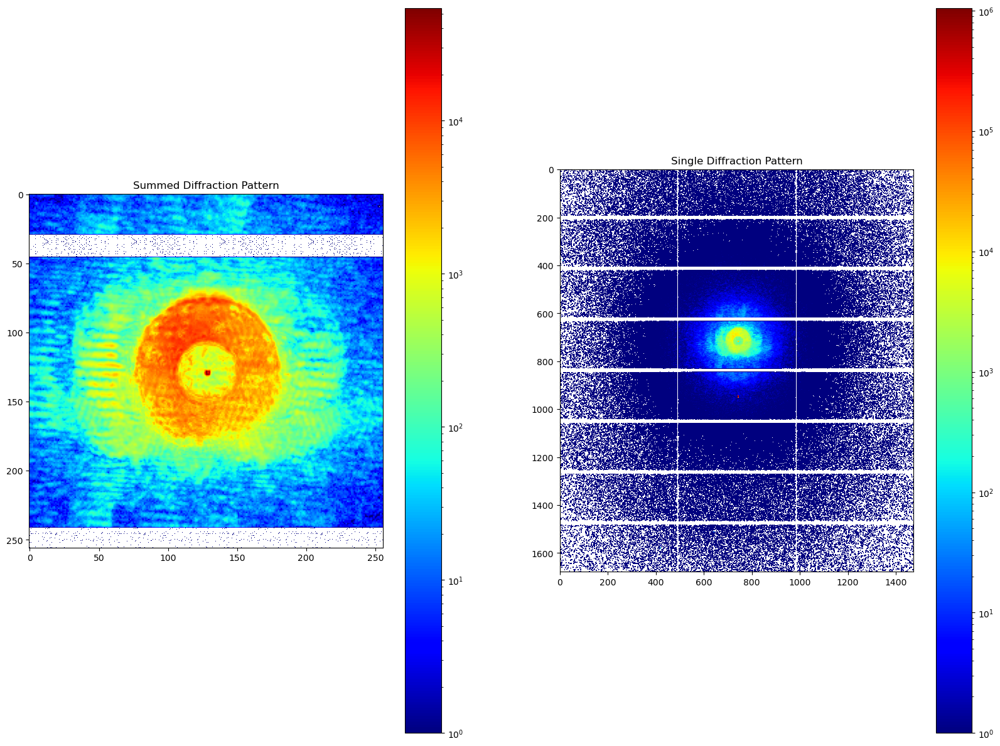

In [103]:
#scan info for ZC4
ncols=41#36
nrows=31#29
center=(718,742)
index=635
# dps_size = dps[0].shape
# center_offset_y=dps_size[0]//2-center[0]
# center_offset_x=dps_size[1]//2-center[1]
# dpsize = 256

#crop diffraction patterns
dpsize=256
# dp=dp[center[0]-dpsize//2:center[0]+dpsize//2,
#     center[1]-dpsize//2:center[1]+dpsize//2]
dp=dps[index][center[0]-dpsize//2:center[0]+dpsize//2,
    center[1]-dpsize//2:center[1]+dpsize//2]
#plot diffraction patterns
fig, axs = plt.subplots(1, 2, figsize=(20, 15))
im1=axs[0].imshow(dp, cmap='jet',norm=colors.LogNorm())
axs[0].set_title('Summed Diffraction Pattern')
im2=axs[1].imshow(dps[index], cmap='jet',norm=colors.LogNorm())
axs[1].set_title('Single Diffraction Pattern')
plt.colorbar(im1)
plt.colorbar(im2)
plt.show()


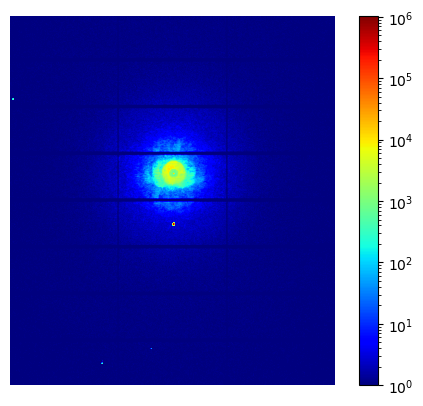

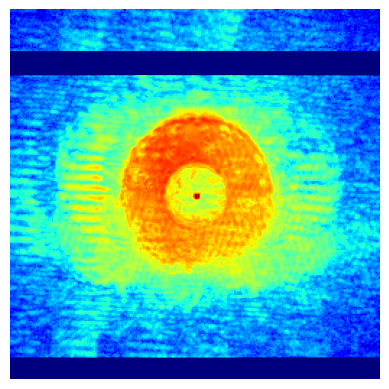

In [104]:
#plot diffraction patterns
im2=plt.imshow(dps[index]+1, cmap='jet',norm=colors.LogNorm())
plt.colorbar(im2)
plt.axis('off')
plt.show()

#plot diffraction patterns
im2=plt.imshow(np.abs(dp)+1, cmap='jet',norm=colors.LogNorm())
#plt.colorbar(im2)
plt.axis('off')
#plt.savefig('dp_635.pdf',dpi=300)
plt.show()

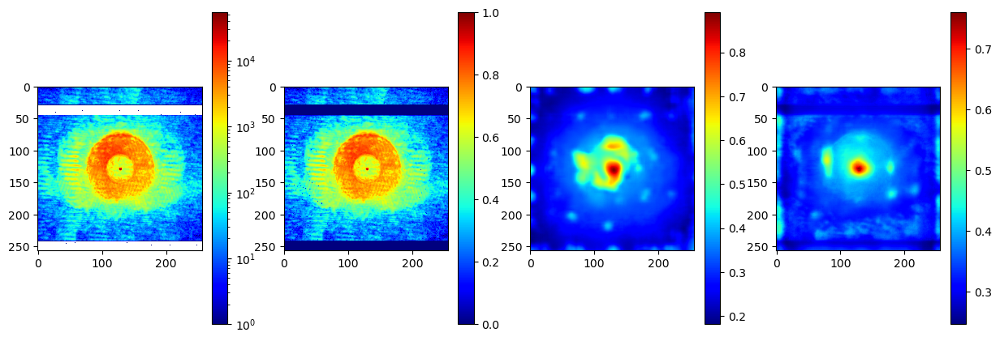

In [105]:
#preprocess diffraction pattern
ri=635#635#664#random.randint(0,len(dps)-1)
dp=dps[ri][center[0]-dpsize//2:center[0]+dpsize//2,
    center[1]-dpsize//2:center[1]+dpsize//2]
mask = ~np.load('/home/beams/PTYCHOSAXS/deconvolutionNN/data/mask/mask_ZC4.npy')
resultT, sfT, bkgT = ptNN_U.preprocess_ZCB_9(dp,mask)
#resultT, sfT, bkgT = ptNN_U.preprocess_ZCB_9(dp, create_circular_waxs_mask_min_value(mask,54))

#plot diffraction pattern and deconvolved pattern
fig,ax=plt.subplots(1,4,figsize=(15,5))
im1=ax[0].imshow(dp,norm=colors.LogNorm(),cmap='jet')
im2=ax[1].imshow(resultT[0][0],cmap='jet')
im3=ax[2].imshow(model_new(resultT.to(device=device, dtype=torch.float)).detach().to("cpu").numpy()[0][0],cmap='jet')
im4=ax[3].imshow(models[0](resultT.to(device=device, dtype=torch.float)).detach().to("cpu").numpy()[0][0],cmap='jet')

plt.colorbar(im1)
plt.colorbar(im2)
plt.colorbar(im3)
plt.colorbar(im4)
plt.show()

In [106]:
output_list=[]
input_list=[]
raw_list=[]
sfs=[]
bkgs=[]
mask = ~np.load('/home/beams/PTYCHOSAXS/deconvolutionNN/data/mask/mask_ZC4.npy')
for i in tqdm(range(len(dps))):
    dp=dps[i][center[0]-dpsize//2:center[0]+dpsize//2,
        center[1]-dpsize//2:center[1]+dpsize//2]

    resultT, sfT, bkgT = ptNN_U.preprocess_ZCB_9(dp,mask)
    #resultT, sfT, bkgT = ptNN_U.preprocess_ZCB_9(dp, create_circular_waxs_mask_min_value(mask,54))
    output=model_new(resultT.to(device=device, dtype=torch.float)).detach().to("cpu").numpy()[0][0]
    raw_list.append(dp)
    input_list.append(resultT.to("cpu").numpy()[0][0])
    output_list.append(output)
    sfs.append(sfT)
    bkgs.append(bkgT)
output_list=np.asarray(output_list)
raw_list=np.asarray(raw_list)
input_list=np.asarray(input_list)

100%|██████████| 1476/1476 [00:07<00:00, 187.19it/s]


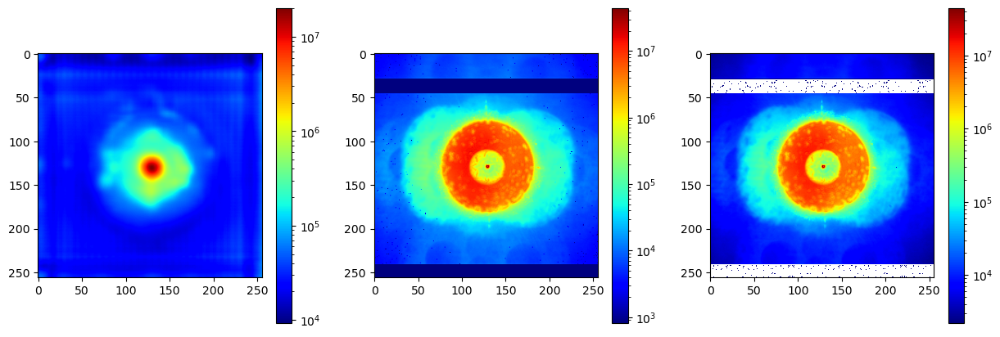

In [107]:
output_list_log=np.zeros_like(output_list)
input_list_log=np.zeros_like(input_list)
raw_list_log=np.zeros_like(raw_list)
for i in range(len(output_list)):
    output_list_log[i]=10**(output_list[i]*sfs[i]+bkgs[i])
    input_list_log[i]=10**(input_list[i]*sfs[i]+bkgs[i])
    raw_list_log[i]=raw_list[i]

fig,ax=plt.subplots(1,3,figsize=(15,5))
im1=ax[0].imshow(np.sum(output_list_log[635-41*10:635+41*10],axis=0),cmap='jet',norm=colors.LogNorm())
im2=ax[1].imshow(np.sum(input_list_log[635-41*10:635+41*10],axis=0),cmap='jet',norm=colors.LogNorm())
im3=ax[2].imshow(np.sum(raw_list_log[635-41*10:635+41*10],axis=0),cmap='jet',norm=colors.LogNorm())
plt.colorbar(im1)
plt.colorbar(im2)
plt.colorbar(im3)
plt.show()

In [108]:
# Choose the model to apply
index=-1
model_type='Unet'
normalize=True
Niter=files[index]
model_applied=models[index]

print("Creating plotter...")
plotter = SP.Scan_Plotter(dps, ptNN_U.preprocess_ZCB_9, mask, model_applied, scanx=41, scany=31,center=center)

print("Normalizing patterns...")
plotter.normalize_patterns(mode=['preprocessed', 'model'], method='subtract_first')

Creating plotter...
Normalizing patterns...
Calculating normalization factors...


  0%|          | 0/1476 [00:00<?, ?it/s]

100%|██████████| 1476/1476 [00:11<00:00, 132.00it/s]


In [ ]:
print("Plotting full scan...")
fig=plotter.plot_full_scan(mode='preprocessed',log_scale=False)
#fig.savefig('full_scan_preprocessed.png')

print("Plotting absorption map...")
absorption_map_preprocessed=plotter.plot_absorption_map(mode='preprocessed',log_scale=False,normalized=normalize)
#absorption_map_preprocessed[0].savefig('absorption_map_preprocessed.png')

print("Plotting azimuthal segments...")
segment_map = plotter.plot_all_azimuthal_segments(num_segments=16, inner_radius=0, 
                                   outer_radius=128, example_idx=635,
                                   mode='preprocessed',log_scale=False,normalized=normalize)
#segment_map[0].savefig('segment_map_preprocessed.png')


Plotting full scan...


100%|██████████| 1271/1271 [00:00<00:00, 1368.06it/s]


Plotting full scan...


100%|██████████| 1271/1271 [00:00<00:00, 1644.25it/s]


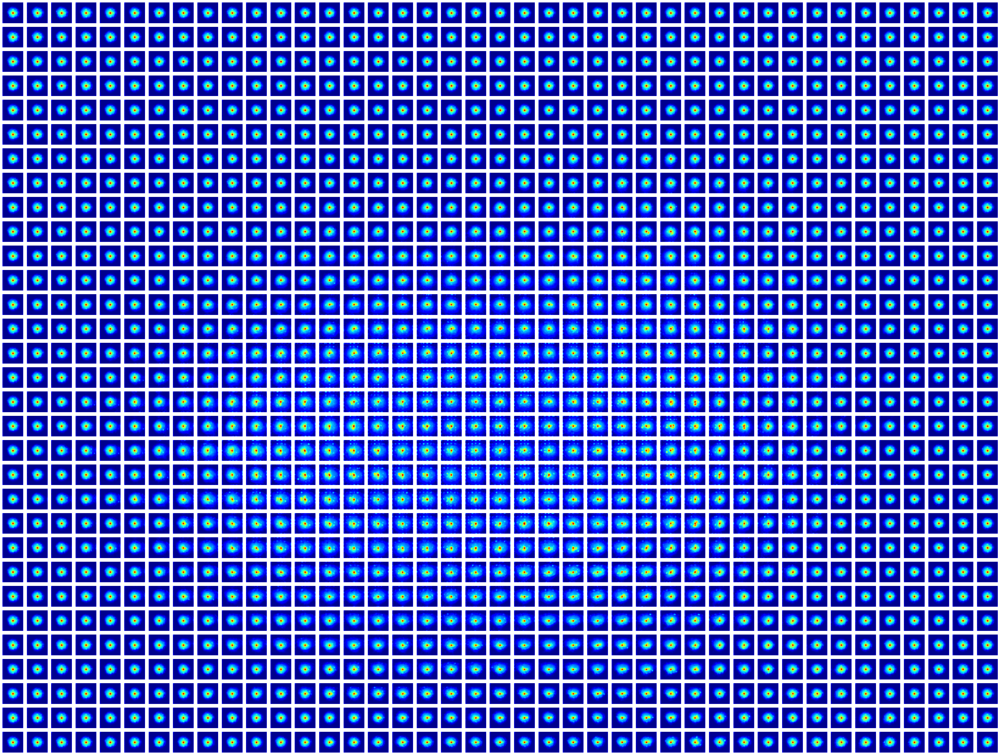

Plotting absorption map...


100%|██████████| 1271/1271 [00:00<00:00, 13503.28it/s]


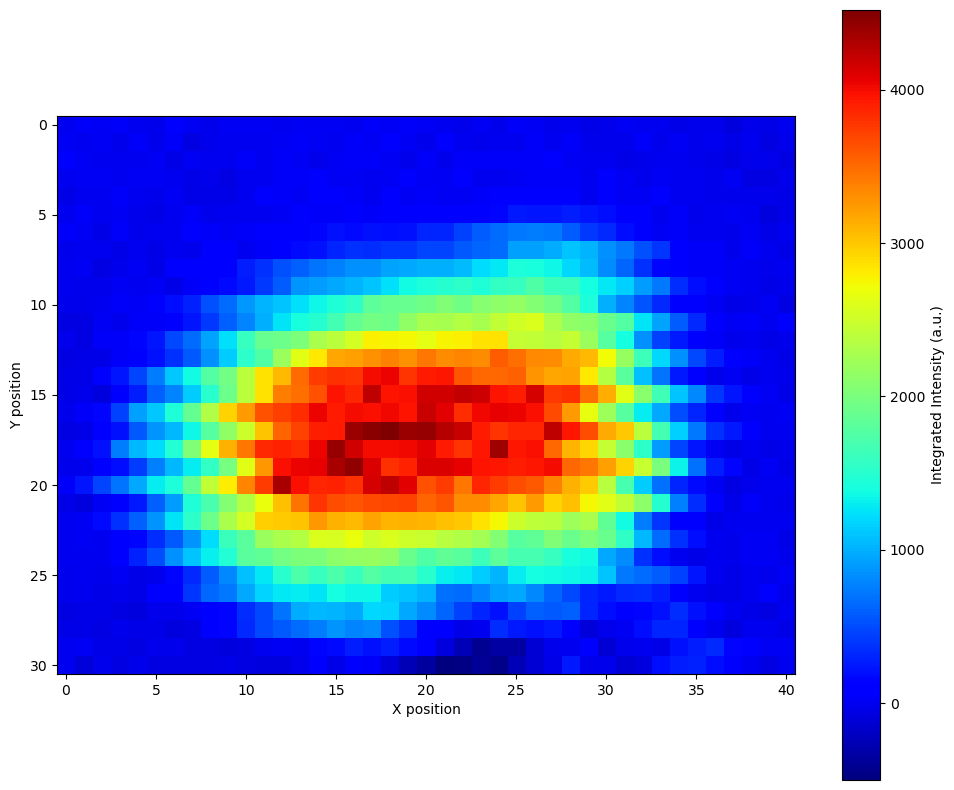

Plotting azimuthal segments...
Processing diffraction patterns...


100%|██████████| 1271/1271 [00:00<00:00, 1137635.59it/s]

Creating segment maps...



/home/beams0/PTYCHOSAXS/NN/ptychosaxsNN/utils/Scan_Plotter.py:679: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


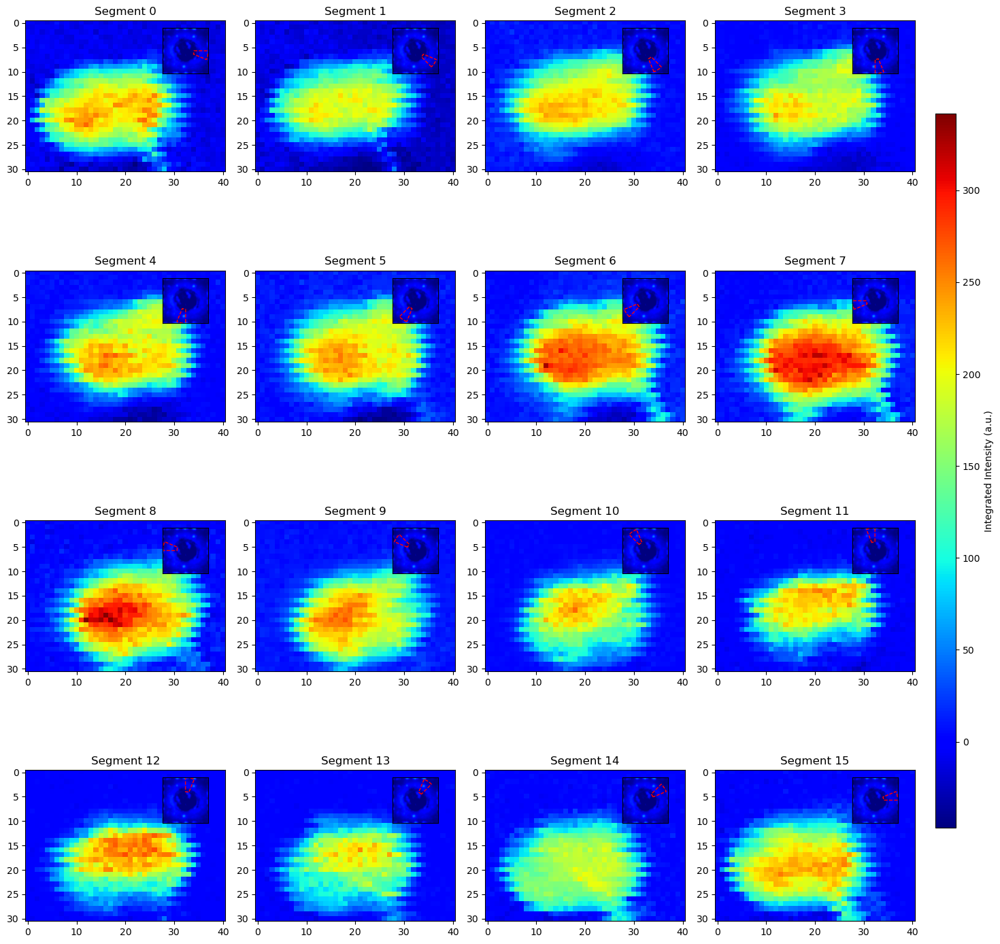

In [ ]:
print("Plotting full scan...")
fig_model=plotter.plot_full_scan(mode='model',log_scale=False)
#fig_model.savefig('full_scan_model_'+model_type+'_'+str(Niter)+'.png')

print("Plotting absorption map...")
absorption_map_model=plotter.plot_absorption_map(mode='model',log_scale=False,normalized=normalize)
#absorption_map_model[0].savefig('absorption_map_model_'+model_type+'_'+str(Niter)+'.png')

print("Plotting azimuthal segments...")
segment_map_model = plotter.plot_all_azimuthal_segments(num_segments=16, inner_radius=48, 
                                   outer_radius=128, example_idx=635,
                                   mode='model',log_scale=False,normalized=normalize)
#segment_map_model[0].savefig('segment_map_model_'+model_type+'_'+str(Niter)+'.png')
